In [1]:
!pip install dfply
import pandas as pd
import numpy as np
import math
from dfply import *
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
import statistics 
import plotly.graph_objects as go
from scipy import stats
from scipy.stats import pearsonr
import plotly.graph_objects as go
import warnings
from scipy.stats import shapiro
from datetime import date, timedelta

     |████████████████████████████████| 614kB 2.6MB/s 


/usr/local/lib/python3.6/dist-packages/statsmodels/tools/_testing.py:19: FutureWarning: pandas.util.testing is deprecated. Use the functions in the public API at pandas.testing instead.
  import pandas.util.testing as tm


In [0]:
transfers = pd.read_pickle("/content/drive/My Drive/Capstone/Data/Clean/Transfers_Clean.pkl")
gk_stats = pd.read_pickle("/content/drive/My Drive/Capstone/Data/Clean/gk_stats_wide.pkl")
players = pd.read_pickle("/content/drive/My Drive/Capstone/Data/Clean/Players_Clean.pkl")
stats_detailed = pd.read_pickle("/content/drive/My Drive/Capstone/Data/Clean/player_stats_wide.pkl")
gk_ratios = pd.read_pickle("/content/drive/My Drive/Capstone/Data/Clean/gk_ratios.pkl")
players_ratios = pd.read_pickle("/content/drive/My Drive/Capstone/Data/Clean/players_ratios.pkl")

In [0]:
import sys
sys.path.append("/content/drive/My Drive/Capstone/Helpers/EDA/")
from tfee_eda_helpers import *

In [0]:
def summer_winter(date):
  month = date.month
  if 0 <= month <= 2:
    return "winter"
  elif 6 <= month <= 8:
    return "summer"
  else:
    return "mid_seson"

def get_age(age_delta):
  result = math.nan
  try:
    result = int(age_delta / timedelta(days=365.2425))
  except:
    pass
  return result    

def ready_for_eda(transfers,players):
  transfers_eda = (transfers >> mask(X.fee != 0, X.loan == False))
  transfers_eda["type"] = transfers_eda.date.apply(summer_winter)
  transfers_eda["type"] = transfers_eda["type"].astype('category') 
  transfers_eda["year"] = transfers_eda.date.apply(lambda date: date.year)
  players_tm = players.reset_index()
  transfers_merged = pd.merge(transfers_eda,
                  players_tm[['tm_id','name', 'dob', 'nationality', 'continent','field_position','main_field_position']],
                  on='tm_id')
  transfers_merged["age"] = (transfers_merged.date - transfers_merged.dob)
  transfers_merged.age = transfers_merged.age.apply(get_age) 
  return transfers_merged

In [0]:
transfers_eda = pd.read_pickle("/content/drive/My Drive/Capstone/Data/Eda/transfers_eda_data.pkl")

# Player's transfer fee correlated variables

## Transfer fee vs age

In [6]:
age_fee_scatter = scatter(transfers_eda,"age","fee",
                          {"fee": "Player's transfer fee", "age" : "Player's age"}, title = "Transfer Fee vs Age")

Correlation between the variables 0.06802797400057643


As we can see the situation for age - transfer fee correlation is very similar to age - market value correlation. However due to the data's scope, the correlation is positive, but very unsignificant. This is because, not all the players in the dataset have transfers, and also some of the expensive transfers included aged players. But overall, the most expensive players being sold are aged in 20 - 29 years old region. The only notable difference with market value's case is that there are more younger players who are sold expensive.

In [7]:
age_fee_scatter = scatter(transfers_eda,"age","fee",
                          {"fee": "Player's transfer fee", "age" : "Player's age"}, 
                          title = "Transfer Fee vs Age by positions", facet = True)

Correlation between the variables 0.06802797400057643


If we investigate age transfer fee correlation by positions we can see that attackers and midfielders are evidently more expensive than goalkeepers and defenders. Most of the outlying and very expensive transfers are among attackers and some among midfielders, whereas goalkeepers and defenders have only a few very expensive transfers 

In [8]:
mv_fee_scatter_cont = scatter(transfers_eda,"age","fee",
                          {"age": "Player's Age", "fee" : "Player's tranfer value"}, 
                          title = "Transfer Fee vs age in each continent",
                          facet = True, facet_var = "continent")

Correlation between the variables 0.06802797400057643


In [9]:
mv_fee_scatter_cont = scatter(transfers_eda,"age","fee",
                          {"age": "Player's Age", "fee" : "Player's tranfer value"}, 
                          title = "Transfer Fee vs age by positions in each continent",
                          facet_row = True)

Correlation between the variables 0.06802797400057643


If we investigate the correlation by positions in each continent we can see that except, european and south american countries, the players from the other continents generally do not have any change in their transfer fees over their age. Goalkeepers' age seem to have the least correlation with his transfer value.

As we can see the maximum transfer fee for european players is reached at oldest ages, having many expensive transfers in the region, where the player's age is very close to 30

## Transfer fee vs market value

In [10]:
mv_fee_scatter = scatter(transfers_eda,"mv","fee",
                          {"fee": "Player's transfer fee", "mv" : "Player's market value"}, 
                          title = "Transfer Fee vs Market value")

Correlation between the variables 0.8716411902933268


As the visualization shows, the correlation between the transfer's fee and his market value at the time of the transfer is very high. In the cases where the transfer fee of the player was higher than his market value at that time, most of the players are young with high potential,examples are Kilian Mbappe, Ousman Dembele, or old but very good players, such as Cristiano Ronaldo. For the other case, where the player's market value was higher than his transfer fee, most of the cases where related to old players or relatively young(25-29) players with very low expiry time left on their contract at the time of his transfer, a good example is Eden Hazard(mv = 150m, transfer_fee = 100m, conract_expiry at the time of the transfer = 1 year)

In [11]:
mv_fee_scatter = scatter(transfers_eda,"mv","fee",
                          {"fee": "Player's transfer Fee", "mv" : "Player's market value"}, 
                          title = "Transfer Fee vs Market value by positions", facet = True)

Correlation between the variables 0.8716411902933268


If we investigate this correlation by position we can see, that the most stable positions in this aspect are midfielders and defenders, as most of the time their transfer values are very close to their market value, attackers have highest number of outliers, whereas the goalkeepers have the lowest. However goalkeepeers' transfers are not happenig very often and the most expensive goalkeeper's transfer value is close to a mid level attackers transfer value. ~80m

In [12]:
mv_fee_scatter_cont = scatter(transfers_eda,"mv","fee",
                          {"fee": "Transfer Fee", "mv" : "Market Value"}, 
                          title = "Transfer Fee vs Market value in each continent",
                          facet_var = "continent", facet = True)

Correlation between the variables 0.8716411902933268


As we can see again, the market value is very highly correlated with the transver fee only in european and south american countries, and a little bit in African countries.

In [13]:
mv_fee_scatter_cont = scatter(transfers_eda,"mv","fee",
                          {"fee": "Transfer Fee", "mv" : "Market Value"}, 
                          title = "Transfer Fee vs Market value by positions in each continent",
                          facet_row = True)

Correlation between the variables 0.8716411902933268


We can see that the highest correlation between market value and trasnfer fee is among african strikers. This is mainly because the african players are not that famous outside the football pitch, they are not famous in social media, so there are no other factors affecting their price. The correlation is also very high among South American midfielders.

In [14]:
mv_tf_cor = cor_over_time(transfers_eda, "fee", "mv", 
                          "Market value correlation with transfer's fee", 
                          "Correlation of market value with trasnfer fee over years")

As we can see the highest correlations between the transfer fees and market values were before 2010. Also we can notice that after each world cup year(2006, 2010, ..., 2018), the correlation between the variables decreased as most of the time the players who played well in the tournament were sold for a price higher than their real value. And also we can see multiple cases, where the correlation decreased significantly the following year. Those are 2009, 2005, 2013 and 2016, 2019. Here again I noticed a pattern. During years 2009,2013 and 2016 transfer records were broken. So after a new expensive transfer, the fees for players became higher and thus less correlated to their market value.

In [0]:
fee = transfers_eda.fee
transfers_out = transfers_eda[~transfers_eda.fee.between(fee.quantile(.15), fee.quantile(.85))]
transfers_norm = transfers_eda[transfers_eda.fee.between(fee.quantile(.15), fee.quantile(.85))]

# Transfer fee over years

In [16]:
tmean = transfers_by_time(transfers_eda, "year", "Year", "Transfer fee over Years(mean as summarizer)", "main_field_position")

If we take mean as a summarizer for transfer fee over years, the highest point appears at the early years, as during that years transfers were not common things and in case of expensive transfers the mean transfer fee became very high. We can see that the higest point was in 2001 for goalkeepers, as in that year the transfer record for goalkeepers was beaten, when Buffon was bought for around 53m euros. Over time the high points seem to become less common as more expensive transfers happen.

In [17]:
tmedian = transfers_by_time(transfers_eda, "year", "Year", "Transfer fee over Years(median as summarizer)", "main_field_position",
                            summarizer = "median")

After taking median as a summarizer we can see the position for the highest point changed becomming midfielders and attackers in 2000s. The goalkeepers do not have high value, taken median as a summarizer as median is sensitive to extreme values and expensive goalkeeper transfers are very rare phenomenon in soccer.

In [18]:
tmedian = transfers_by_time(transfers_eda, "year", "Year", "Transfer fee over Years(max as summarizer)", "main_field_position",
                            summarizer = "max")

Taking maximum as a summarizer we can see the transfer fee record breaking years for each position. In this aspect the goalkeepers are the most stable position as there were only 2 cases of goalkeeper transfers when the fee was record breaking. Deffenders are also mostly stable in this aspect with a few record breaking transfers in this period. Midfielders also have only a few occurances of record breaking transfers and the periods between two record breaking transfers was very long before 2014, after which the record was beaten twice in 4 years. Attackers have the higest transfer fee records and have the shortest periods among the record breaking transfers. Also the difference betweent two record transfers price was highest among attackers. That transfer took place in 2018 and the fee paid was two times expensive than the previous transfer record's fee. More details about Transfer Records can be found [here](https://www.transfermarkt.com/statistik/transferrekordehistorie).

# Transfer fee over age

In [19]:
tmedian = transfers_by_time(transfers_eda, "age", "age", "Transfer fee over Age of the player(mean as summarizer)", "main_field_position",
                            summarizer = "mean")

In [20]:
tmedian = transfers_by_time(transfers_eda, "age", "age", "Transfer fee over Age of the player(max as summarizer)", "main_field_position",
                            summarizer = "max")

# Transfer fee based on transfer window type.

In [21]:
tmean = transfers_by_time(transfers_eda, "year", "Year", "Transfer fee over Years by transfer window type", "type")

As expected the most expensive trasnfers mostly happen during summer transfer window, as the teams have more time to make the transfers. There are also some years when relatively expensive transfers happened during the middle of the season. But most of the time transfers in the middle of the season are rare events.

In [22]:
tmean = transfers_by_time(transfers_eda, "year", "Year", "Transfer fee over Years", "type", 
                          summarizer = "median")

Taking median as a summarizer proves my point, as the high points for summarized trasnfer fees in mid-season transfers dissapeared.

In [23]:
plot_df = (transfers_eda >> 
 group_by(X["type"],X["year"],X["main_field_position"]) >> 
  summarise(fee_summary = X.fee.max())
 )
fig = px.line(plot_df, x = "year", y = "fee_summary", 
              color = "type", title = "Transfer fee over years by type of the window and positon of the player",
              facet_col = "main_field_position", facet_col_wrap=4,
              facet_row = "type",
              labels = { "year" : "Year", "fee_summary" : ""},
            )
fig.for_each_annotation(lambda a: a.update(text=a.text.split("=")[1]))
fig.for_each_trace(lambda t: t.update(name=t.name.split("=")[1]))
fig.show()

Taking max as a summarizer we can see that almost all the records were beaten during summer tranfers' window, except for midfielders, for which the transfer record for that position was beaten during a winter transfer window. Also one of the records for attackers was beaten in 2013's mid season as Gareth Bale's transfer happened on September 2.

In [0]:
gk_transfers = transfers_eda >> mask(X.field_position == "GK")

In [0]:
players_transfers = transfers_eda >> mask(X.field_position != "GK")

In [0]:
players_transfers_stats = pd.merge(players_transfers, stats_detailed, on = ["tm_id","season"]) 
players_transfers_ratios = pd.merge(players_transfers, players_ratios, on = ["tm_id","season"]) 

In [0]:
gk_transfers_stats = pd.merge(gk_transfers, gk_stats, on = ["tm_id","season"]) 
gk_transfers_ratios = pd.merge(gk_transfers, gk_ratios, on = ["tm_id","season"]) 

In [0]:
gk_transfers_stats.rename(columns = {"date_x":"transfer_date", "date_y":"stats_date"}, inplace = True)
gk_transfers_ratios.rename(columns = {"date_x":"transfer_date", "date_y":"stats_date"}, inplace = True)

In [0]:
players_transfers_stats.rename(columns = {"date_x":"transfer_date", "date_y":"stats_date"}, inplace = True)
players_transfers_ratios.rename(columns = {"date_x":"transfer_date", "date_y":"stats_date"}, inplace = True)

In [0]:
gk_cols = ['fee', 'mv','age', 'app', 'cs', 'gc', 'mp',
       'og', 'rc', 'syc', 's', 'soff', 'son', 'yc','ppg']
gk_cum_cols = ['fee','mv','cum_app', 'cum_cs', 'cum_gc', 'cum_mp', 'cum_og', 'cum_rc', 'cum_syc',
       'cum_s', 'cum_soff', 'cum_son', 'cum_yc', 'cum_ppg', 'cum_games_won']
pl_cols = ['fee', 'mv','age', 'app', 'a', 'g', 'mp',
       'og', 'pg', 'rc', 'syc', 's', 'soff', 'son', 'yc', 'mpg',
       'ppg']
pl_cum_cols = ['fee','mv','cum_app', 'cum_mp', 'cum_og', 'cum_rc', 'cum_syc', 'cum_s',
       'cum_soff', 'cum_son', 'cum_yc', 'cum_a', 'cum_g', 'cum_mpg', 'cum_pg',
       'cum_ppg', 'cum_games_won']

# Transfer fee correlation to statistic metrics of the players by each position

## GK

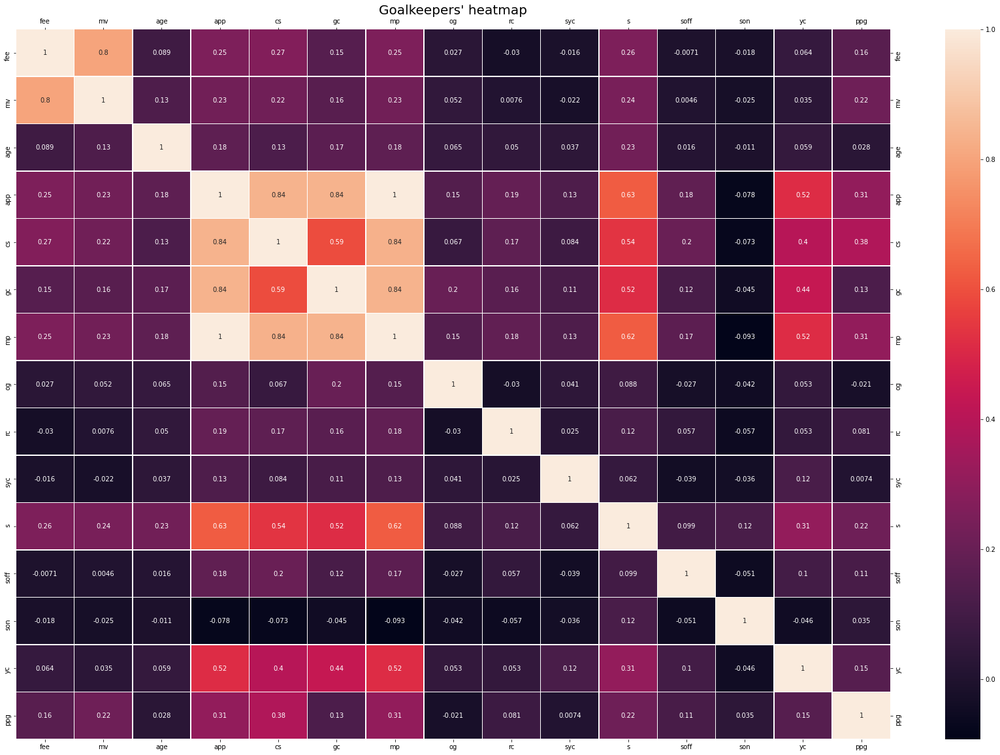

In [32]:
gk_hm = heat_map(gk_transfers_stats[gk_cols], title = "Goalkeepers' heatmap")

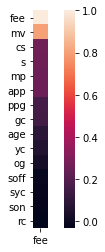

In [33]:
gk_corr = gk_transfers_stats[gk_cols].select_dtypes(include=['float64']).corr()
gk_fee_corr = gk_corr[['fee']].sort_values(by = "fee",ascending = False)
sns.heatmap(gk_fee_corr, square = True);

As we can see the most correlated variables to transfer fee are the appearances of the goalkeepers, the number of clean sheets and minutes played.

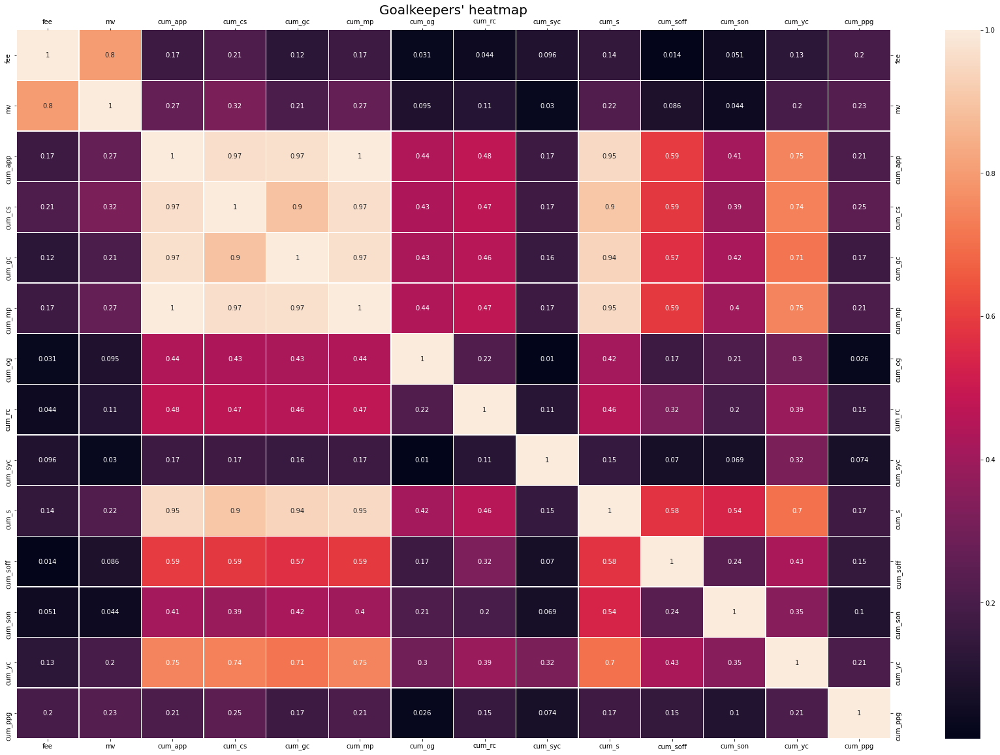

In [34]:
gk_hm = heat_map(gk_transfers_stats[gk_cum_cols],title = "Goalkeepers' heatmap")

As we can see seasonal values of those attributes are more correlated to the player's transfer value rather than the values of all years before the transfer year. However we can see that the cumulative attributes are more correlated to the player's market value rather than the seasonal ones.

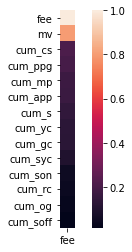

In [35]:
gk_corr = gk_transfers_stats[gk_cum_cols].select_dtypes(include=['float64']).corr()
gk_fee_corr = gk_corr[['fee']].sort_values(by = "fee",ascending = False)
sns.heatmap(gk_fee_corr, square = True);

In [36]:
px.scatter(gk_transfers.dropna(), "mv","fee",
           labels = {"mv":"Market Value", "fee":"Transfer Fee"},
           trendline = "ols", 
           title = "Transfer fee vs Market Value(Goalkeepers)")

In [37]:
px.scatter(gk_transfers_stats.dropna(), "cs","fee",
           labels = {"cs":"Number of clean sheets", "fee":"Transfer Fee"},
           trendline = "ols", 
           title = "Transfer fee vs Clean Sheets")

In [0]:
def_transfers = players_transfers_stats[players_transfers_stats.main_field_position == "defenders"]
mid_transfers = players_transfers_stats[players_transfers_stats.main_field_position == "midfielders"]
att_transfers = players_transfers_stats[players_transfers_stats.main_field_position == "attackers"]

In [39]:
att_transfers.drop("year_y", axis = 1, inplace = True)
att_transfers.rename({"year_x":"year"}, axis = 1, inplace = True)
mid_transfers.drop("year_y", axis = 1, inplace = True)
mid_transfers.rename({"year_x":"year"}, axis = 1, inplace = True)

/usr/local/lib/python3.6/dist-packages/pandas/core/frame.py:3997: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/usr/local/lib/python3.6/dist-packages/pandas/core/frame.py:4133: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



## Defenders

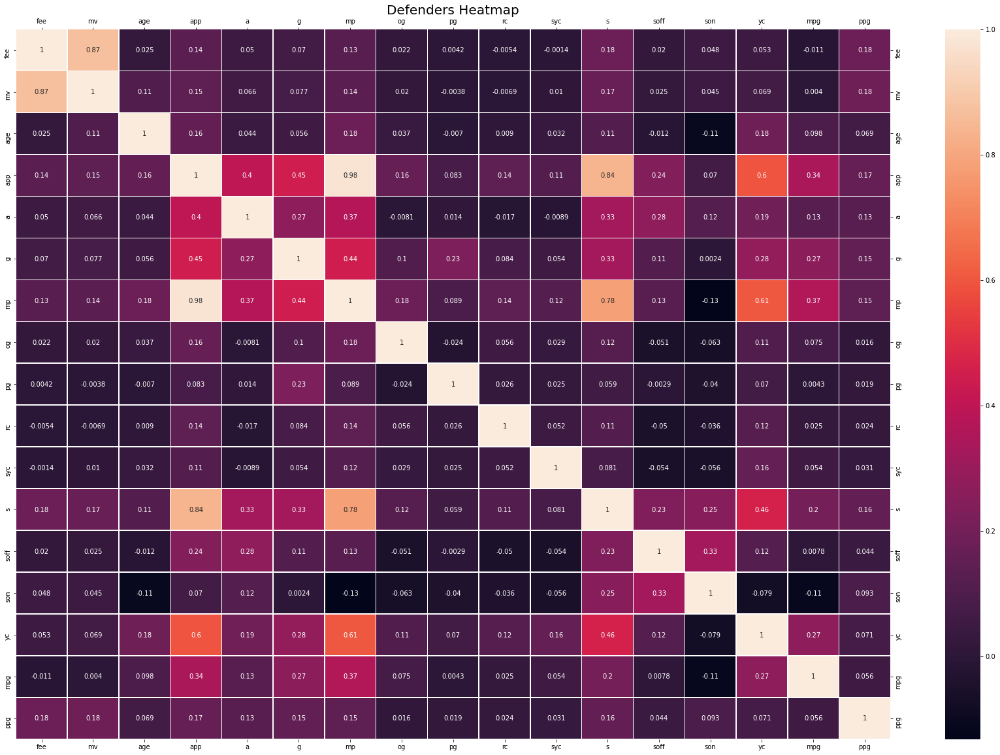

In [40]:
df_hm = heat_map(def_transfers[pl_cols],"Defenders Heatmap")

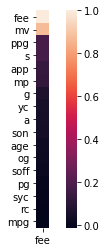

In [41]:
def_corr = def_transfers[pl_cols].select_dtypes(include=['float64']).corr()
def_fee_corr = def_corr[['fee']].sort_values(by = "fee",ascending = False)
sns.heatmap(def_fee_corr, square = True);

For deffenders' seasonal attributes the most correlated variables to his transfer fee are squad appearences and points per game when the player was in the field.

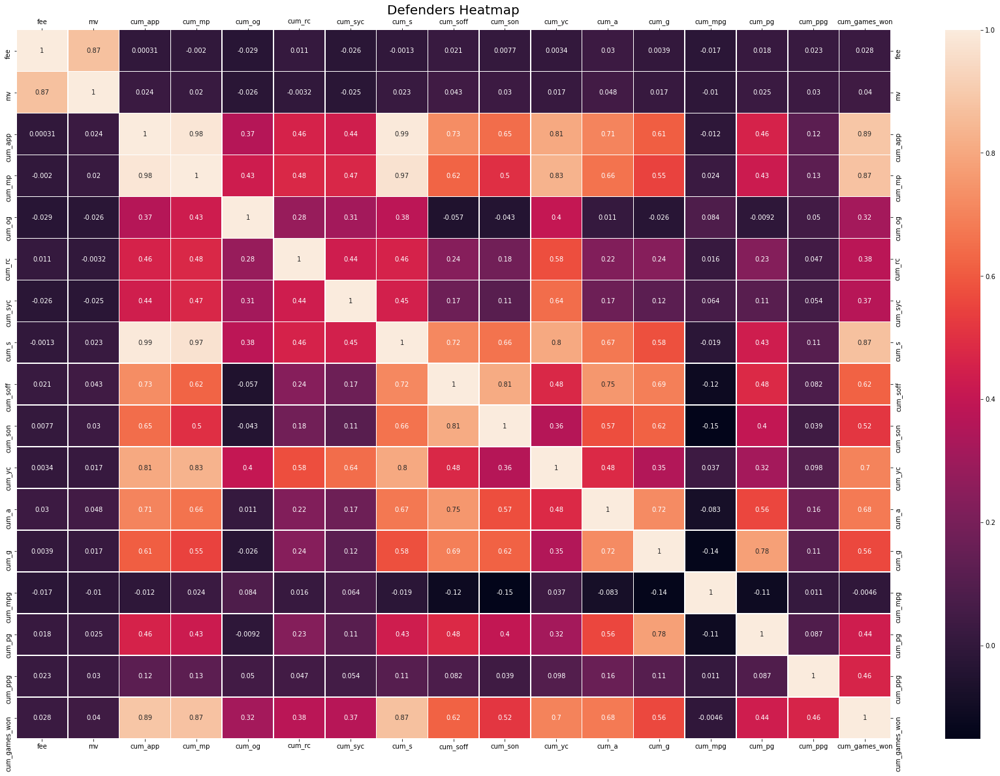

In [42]:
df_hm = heat_map(def_transfers[pl_cum_cols],"Defenders Heatmap")

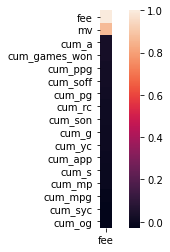

In [43]:
def_corr = def_transfers[pl_cum_cols].select_dtypes(include=['float64']).corr()
def_fee_corr = def_corr[['fee']].sort_values(by = "fee",ascending = False)
sns.heatmap(def_fee_corr, square = True);

In [61]:
px.scatter(def_transfers.dropna(), "mv","fee",
           labels = {"mv":"Market Value", "fee":"Transfer Fee"},
           trendline = "ols", 
           title = "Transfer fee vs Market Value(Defenders)")

## Midfielders

The cumulative attributes for defenders are not even relatively correlated to his market value.

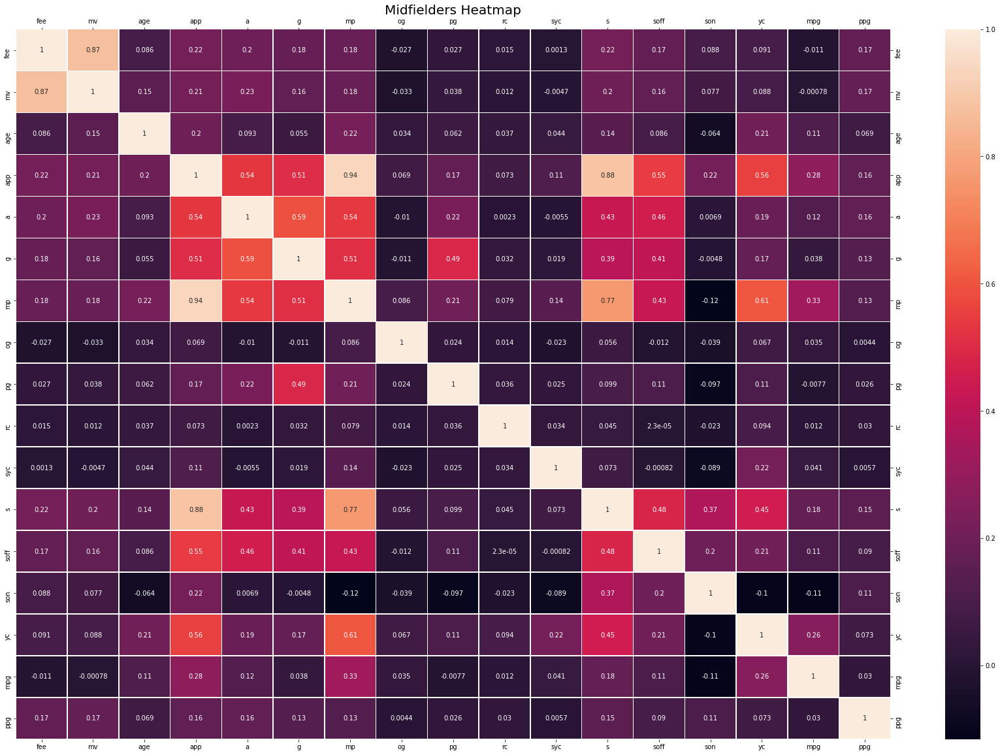

In [44]:
mf_hm = heat_map(mid_transfers[pl_cols],"Midfielders Heatmap")

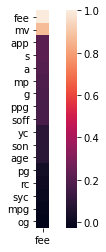

In [45]:
mid_corr = mid_transfers[pl_cols].select_dtypes(include=['float64']).corr()
mid_fee_corr = mid_corr[['fee']].sort_values(by = "fee",ascending = False)
sns.heatmap(mid_fee_corr, square = True);

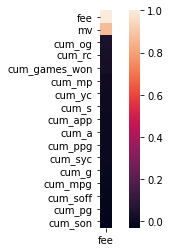

In [46]:
mid_corr = mid_transfers[pl_cum_cols].select_dtypes(include=['float64']).corr()
mid_fee_corr = mid_corr[['fee']].sort_values(by = "fee",ascending = False)
sns.heatmap(mid_fee_corr, square = True);

Appearences and assists are the most correlated seasonal variabels to transfer fee.

In [67]:
px.scatter(mid_transfers.dropna(), "mv","fee",
           labels = {"mv":"Market Value", "fee":"Transfer Fee"},
           trendline = "ols", 
           title = "Transfer fee vs Market Value(Midfielders)")

In [69]:
px.scatter(mid_transfers.dropna(), "app","fee",
           labels = {"app":"Number of Appearances", "fee":"Transfer Fee"},
           trendline = "ols", 
           title = "Transfer fee vs Number Appearances(Midfielders)")

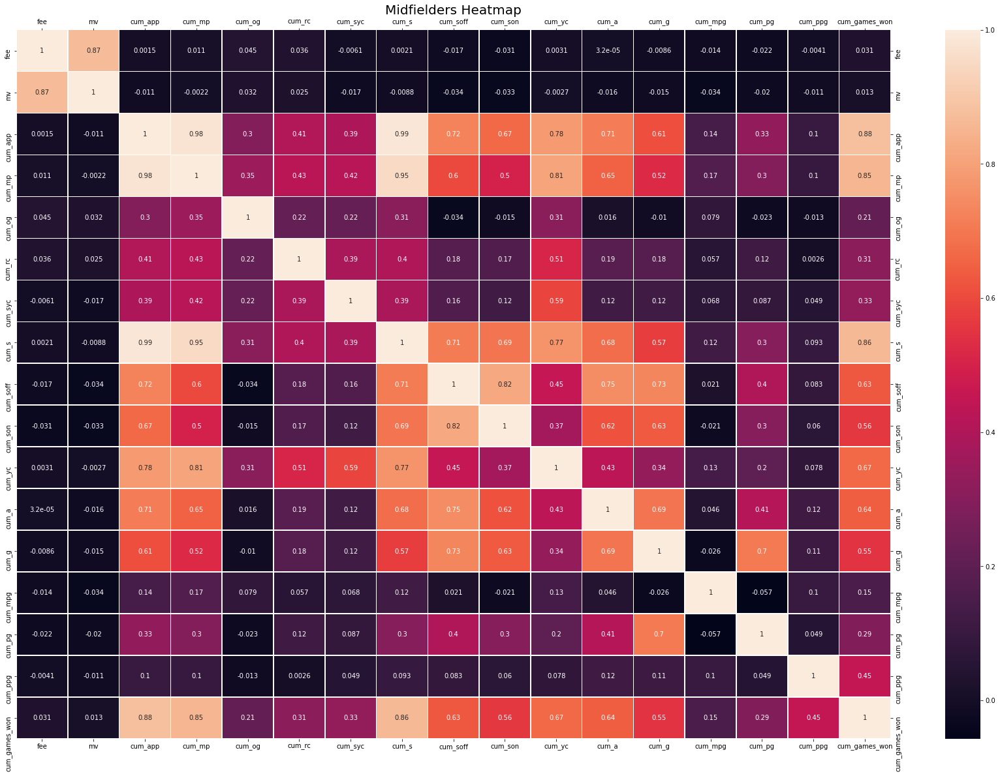

In [47]:
mf_hm = heat_map(mid_transfers[pl_cum_cols],"Midfielders Heatmap")

Cumulative values are also uncorellated to neither transfer fee nor market value of the player.

## Attackers

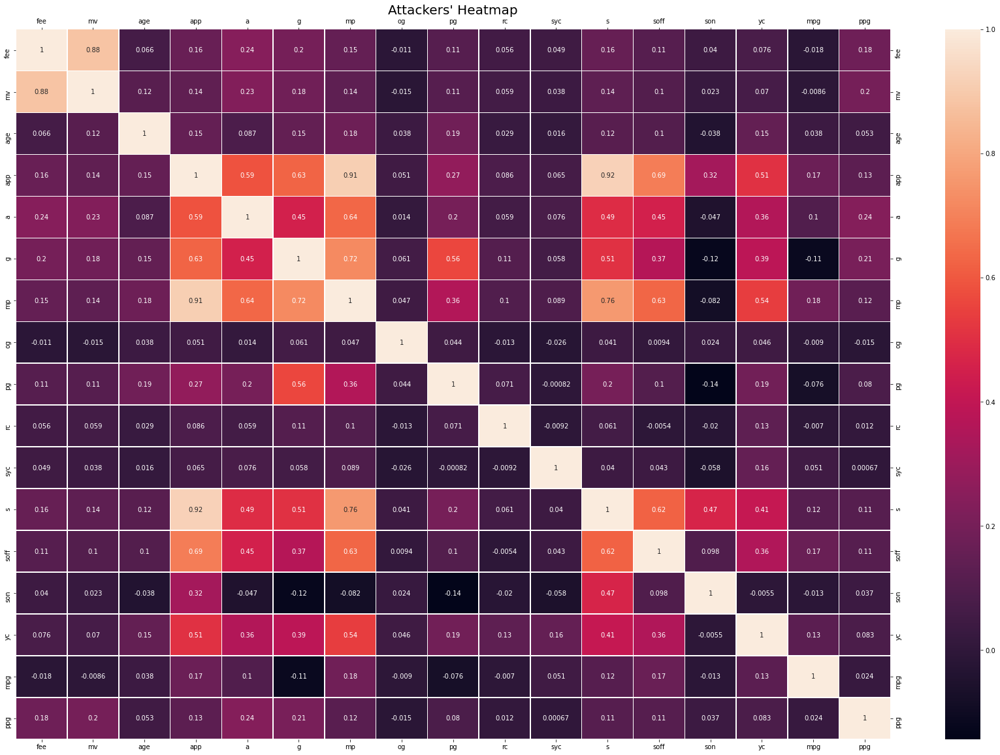

In [48]:
at_hm = heat_map(att_transfers[pl_cols],"Attackers' Heatmap")

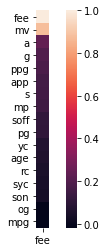

In [49]:
att_corr = att_transfers[pl_cols].select_dtypes(include=['float64']).corr()
att_fee_corr = att_corr[['fee']].sort_values(by = "fee",ascending = False)
sns.heatmap(att_fee_corr, square = True);

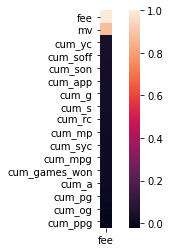

In [50]:
att_corr = att_transfers[pl_cum_cols].select_dtypes(include=['float64']).corr()
att_fee_corr = att_corr[['fee']].sort_values(by = "fee",ascending = False)
sns.heatmap(att_fee_corr, square = True);

Appearences and goals have the higest correlation with transfer fee.

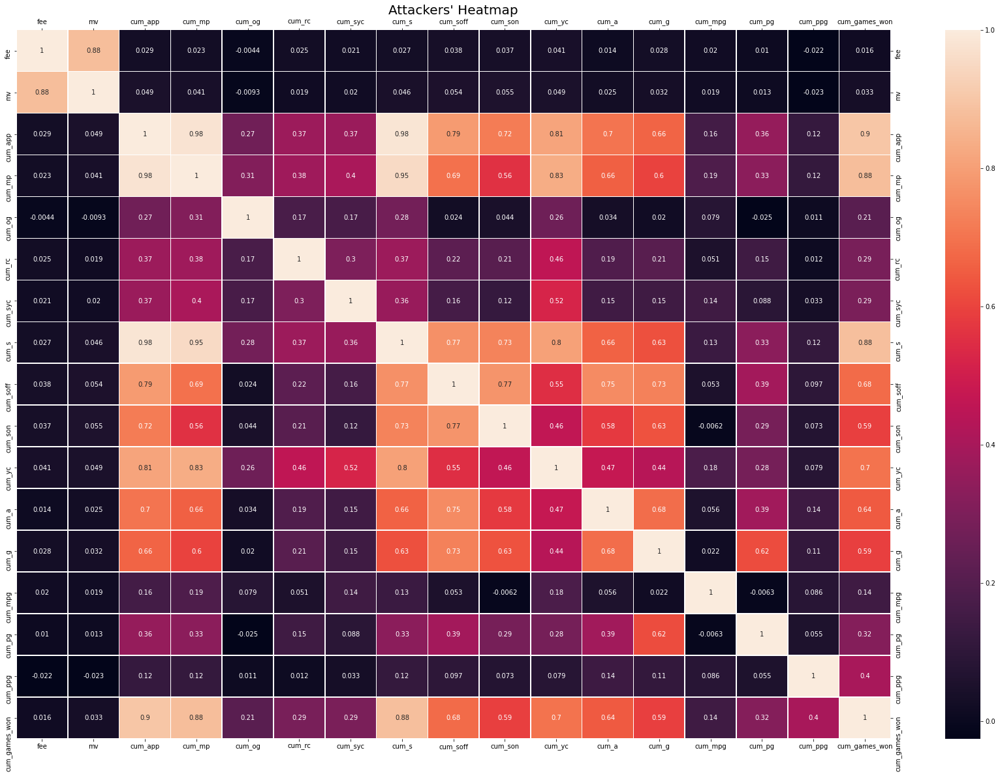

In [51]:
at_hm = heat_map(att_transfers[pl_cum_cols],"Attackers' Heatmap")

Cumulative attributes are also uncorrelated for attackers.

In [74]:
px.scatter(att_transfers.dropna(), "mv","fee",
           labels = {"mv":"Market Value", "fee":"Transfer Fee"},
           trendline = "ols", 
           title = "Transfer fee vs Market Value(Attackers)")

In [73]:
px.scatter(att_transfers.dropna(), "g","fee",
           labels = {"g":"Number of Goals", "fee":"Transfer Fee"},
           trendline = "ols", 
           title = "Transfer fee vs Number of Goals(Attackers)")

In [0]:
def_transfers_ratios = players_transfers_ratios[players_transfers_ratios.main_field_position == "defenders"]
mid_transfers_ratios = players_transfers_ratios[players_transfers_ratios.main_field_position == "midfielders"]
att_transfers_ratios = players_transfers_ratios[players_transfers_ratios.main_field_position == "attackers"]

# Transfer fee correlation to statistical ratios of the players by each position

## GK

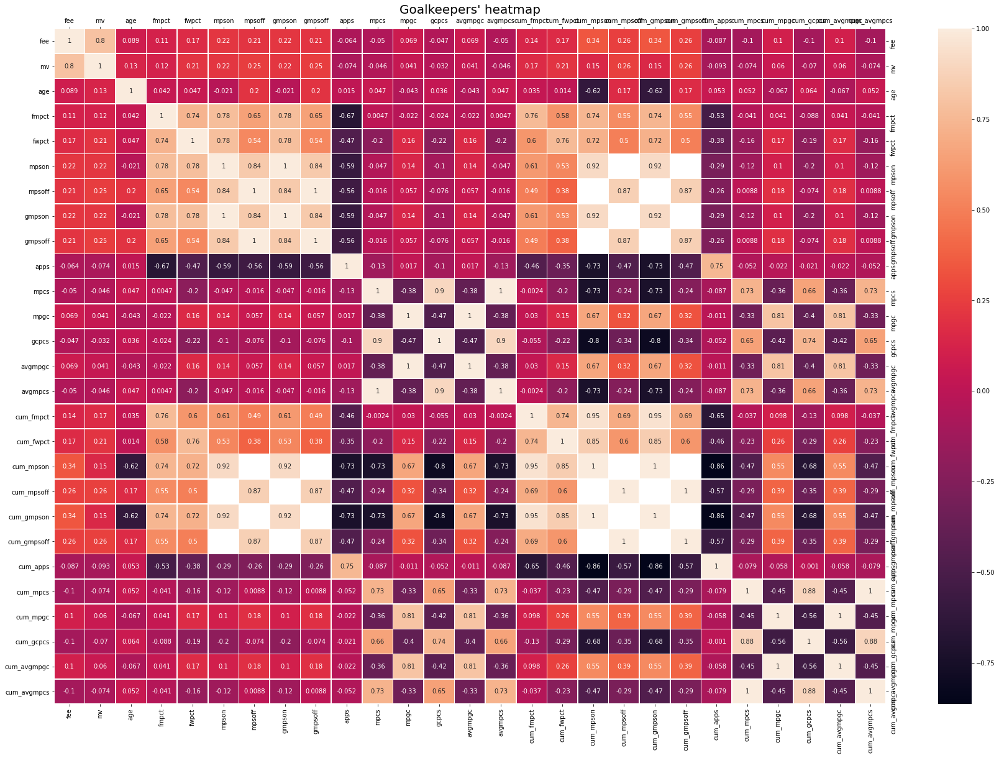

In [53]:
gk_hm = heat_map(gk_transfers_ratios, title = "Goalkeepers' heatmap")

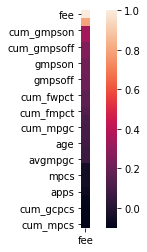

In [54]:
gk_corr = gk_transfers_ratios.select_dtypes(include=['float64']).corr()
gk_fee_corr = gk_corr[['fee']].sort_values(by = "fee",ascending = False)
sns.heatmap(gk_fee_corr, square = True);

## Defenders

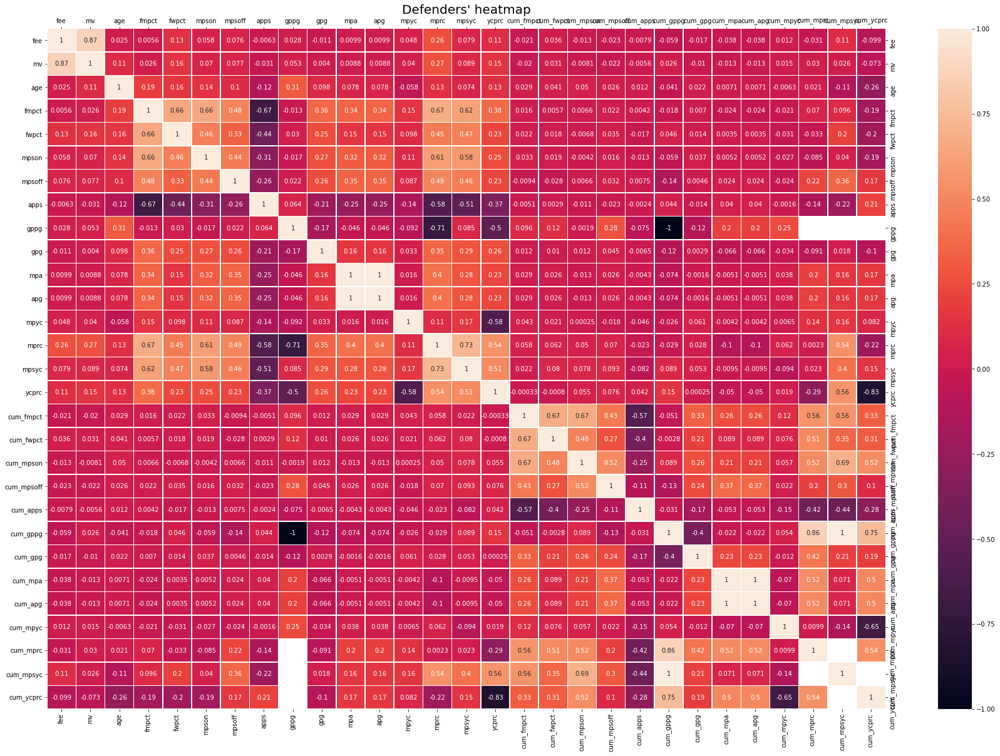

In [55]:
df_hm = heat_map(def_transfers_ratios, title = "Defenders' heatmap")

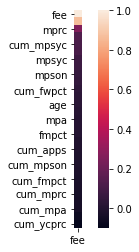

In [56]:
def_corr = def_transfers_ratios.select_dtypes(include=['float64']).corr()
def_fee_corr = def_corr[['fee']].sort_values(by = "fee",ascending = False)
sns.heatmap(def_fee_corr, square = True);

For defenders we can see that the highest correlation with the transfer fee is the minutes per red card statistic of the player. As defender is a very aggresive position in soccer, it is excepted that deffenders can receive many red or yellow cars, so good indicator of a defender can be the interval of receiving red cards in minutes, and generally expensive => good defenders receive a red card more rarely. The ratio of yellow cards and red cards is a good indicator to find out, how many not so dangerous fouls does a player commit before commiting a very dangerous foul, worht a red card. However this ratio is not strongly correlated. Almost the same correlation value to the transfer fee has the win percentage of the player when he is on the field. This is a little bit biased variable as the team's points is not dependent only on the defenders, they alongside with the goalkeepers are responsible for the teams defending qualities and attacking attributes of the team are independent of the defenders' quality.

In [66]:
px.scatter(def_transfers_ratios.dropna(subset=['mprc','fee']), "mprc","fee",
           labels = {"mprc":"Minutes per Red card", "fee":"Transfer Fee"},
           trendline = "ols", 
           title = "Transfer fee vs Minutes per red card(Defenders)")

## Midfielders

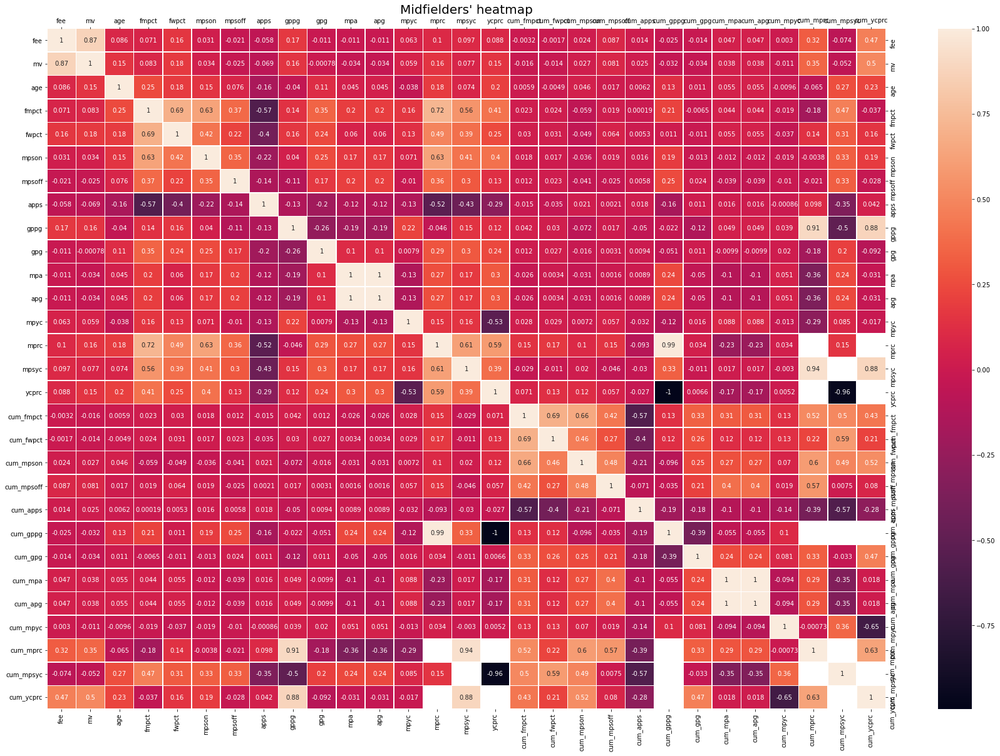

In [57]:
mf_hm = heat_map(mid_transfers_ratios, title = "Midfielders' heatmap")

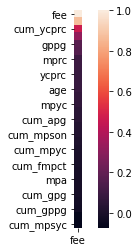

In [58]:
mid_corr = mid_transfers_ratios.select_dtypes(include=['float64']).corr()
mid_fee_corr = mid_corr[['fee']].sort_values(by = "fee",ascending = False)
sns.heatmap(mid_fee_corr, square = True);

The minutes per a red card is strongly correlated to the trasnfer fee, but it is not exlpicit correlation as it is not an attribute for a midfielders so they have high values in this statistic. As most of the midfielders do not foul frequently, except the defensive midfielders, they receive yellow or red cards very rarely, so have high minutes before a punished foul.

## Attackers

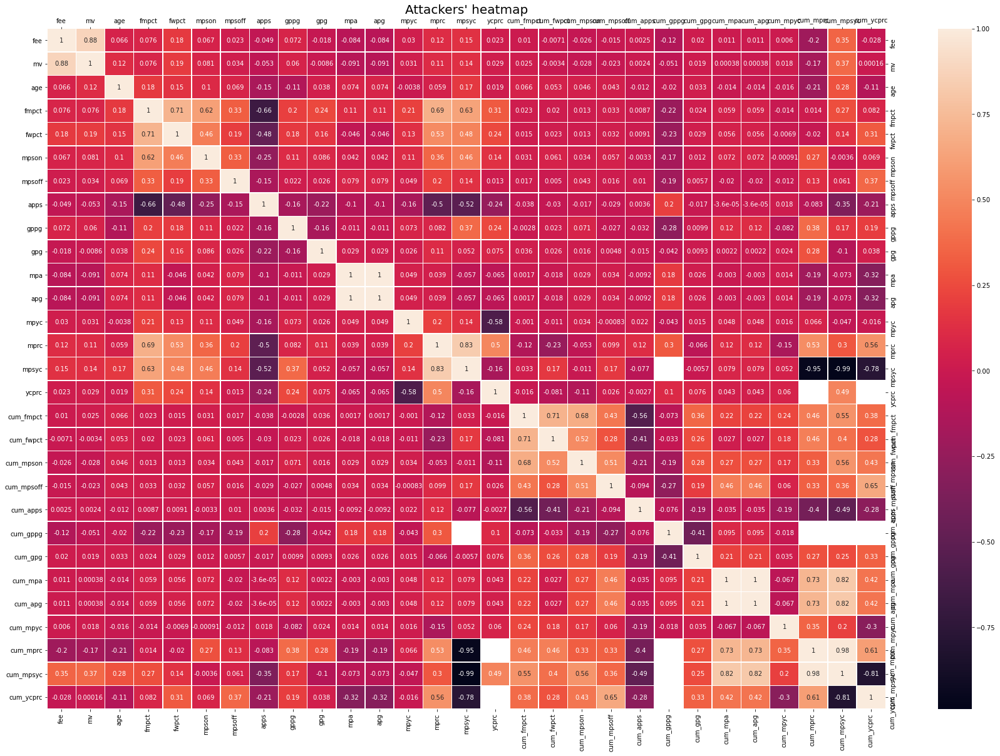

In [59]:
att_hm = heat_map(att_transfers_ratios, title = "Attackers' heatmap")

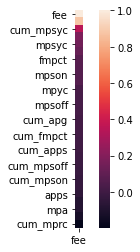

In [60]:
att_corr = att_transfers_ratios.select_dtypes(include=['float64']).corr()
att_fee_corr = att_corr[['fee']].sort_values(by = "fee",ascending = False)
sns.heatmap(att_fee_corr, square = True);

Again the same mismatched correlation exists for attackers.